In [2]:
import os

def find_project_root(start_path=None, marker="TecMul_Intercom"):
    """
    Dynamically find the project root by looking for a known directory or file.
    
    :param start_path: Starting path for the search (defaults to current working directory).
    :param marker: A directory or file that indicates the project root (e.g., 'src', '.git').
    :return: The absolute path to the project root.
    """
    if start_path is None:
        start_path = os.getcwd()
    
    current_path = start_path
    while True:
        if os.path.isdir(os.path.join(current_path, marker)) or os.path.exists(os.path.join(current_path, marker)):
            return current_path
        parent_path = os.path.abspath(os.path.join(current_path, os.pardir))
        if current_path == parent_path:  # Reached the root of the filesystem
            raise RuntimeError(f"Could not find project root containing '{marker}'.")
        current_path = parent_path
        
project_root = find_project_root(marker="src")
os.chdir(project_root)  # Change the working directory to the project root
print(f"Project root set to: {project_root}")

Project root set to: c:\Users\blaf2\git\TecMul_InterCom


In [3]:
import math
import subprocess
import logging
import os
import sys
import numpy as np
import matplotlib.pyplot as plt

class Processing:
    def __init__(self):
        self.quant = ["1", "2", "4", "8", "16", "32", "64", "128", "256", "512", "1024", "2048", "4096", "8182"]
        self.wavelets = ["db1", "db2", "db3", "db4", "db5", "sym4", "sym5", "bior3.3", "bior3.5"]
        self.levels = ["1", "2", "3", "4", "5", "6", "7", "8", "9", "10"]

    def call_temporal_script_no_overlapping_16(self, quant, wavelet, level):
        """
        Calls the 'temporal_no_overlapped_DWT_coding_16.py' script using subprocess,
        and saves the output to a specified file.

        :param quant: Quantization value (string).
        :param wavelet: Wavelet type (string).
        :param level: Level value (string).
        :param output_file: Path to the output text file.
        """
        starting_path= os.getcwd()
        script_path=os.path.join(starting_path, "src", "temporal_no_overlapped_DWT_coding_16.py")
        executorpy=sys.executable
        filesong=os.path.join(starting_path, "data", "AviadorDro_LaZonaFantasma.oga")
        try:
            # Command to execute the script with parameters
            cmd = [
                executorpy, 
                script_path,
                "-q", quant,
                "-w", wavelet,
                "-e", level,
                "--show_stats",
                "-f", filesong,
                "-t","20"
            ]

            # Logging the command being executed for debugging
            logging.info(f"Executing command: {' '.join(cmd)}")

            # Run the command
            result =subprocess.run(cmd, capture_output=True, text=True)
            if result.returncode == 0:
            # Process the captured standard output
                logging.info(f"Script output:\n{result.stdout}")
                return result.stdout
            else:
            # Log and process errors if the script failed
                logging.error(f"Script failed with error:\n{result.stderr}")
                return None
        except Exception as e:
            logging.error(f"An error occurred: {e}")

    def call_temporal_script_no_overlapping_32(self, quant, wavelet, level):
        """
        Calls the 'temporal_no_overlapped_DWT_coding_32.py' script using subprocess,
        and saves the output to a specified file.

        :param quant: Quantization value (string).
        :param wavelet: Wavelet type (string).
        :param level: Level value (string).
        :param output_file: Path to the output text file.
        """
        starting_path= os.getcwd()
        script_path=os.path.join(starting_path, "src", "temporal_no_overlapped_DWT_coding_32.py")
        executorpy=sys.executable
        filesong=os.path.join(starting_path, "data", "AviadorDro_LaZonaFantasma.oga")
        try:
            # Command to execute the script with parameters
            cmd = [
                executorpy, 
                script_path,
                "-q", quant,
                "-w", wavelet,
                "-e", level,
                "--show_stats",
                "-f", filesong,
                "-t","20"
            ]

            # Logging the command being executed for debugging
            logging.info(f"Executing command: {' '.join(cmd)}")

            # Run the command
            result =subprocess.run(cmd, capture_output=True, text=True)
            if result.returncode == 0:
            # Process the captured standard output
                logging.info(f"Script output:\n{result.stdout}")
                return result.stdout
            else:
            # Log and process errors if the script failed
                logging.error(f"Script failed with error:\n{result.stderr}")
                return None

        except Exception as e:
            logging.error(f"An error occurred: {e}")

    def call_temporal_script_overlapping(self, quant, wavelet, level):
        """
        Calls the 'temporal_overlapped_DWT_coding.py' script using subprocess,
        and saves the output to a specified file.

        :param quant: Quantization value (string).
        :param wavelet: Wavelet type (string).
        :param level: Level value (string).
        :param output_file: Path to the output text file.
        """
        starting_path= os.getcwd()
        script_path=os.path.join(starting_path, "src", "temporal_overlapped_DWT_coding.py")
        executorpy=executorpy=sys.executable
        filesong=os.path.join(starting_path, "data", "AviadorDro_LaZonaFantasma.oga")
        try:
            # Command to execute the script with parameters
            cmd = [
                executorpy, 
                script_path,
                "-q", quant,
                "-w", wavelet,
                "-e", level,
                "--show_stats",
                "-f", filesong,
                "-t","20"
            ]

            # Logging the command being executed for debugging
            logging.info(f"Executing command: {' '.join(cmd)}")

            # Run the command
            result =subprocess.run(cmd, capture_output=True, text=True)
            if result.returncode == 0:
            # Process the captured standard output
                logging.info(f"Script output:\n{result.stdout}")
                return result.stdout
            else:
            # Log and process errors if the script failed
                logging.error(f"Script failed with error:\n{result.stderr}")
                return None
        except Exception as e:
            logging.error(f"An error occurred: {e}")

# Logging setup
logging.basicConfig(level=logging.INFO)

In [4]:
# Initialize the processor
processor = Processing()

# User input
sol = input("Do you want to overlap the signals? (y/n) ").lower()
absolute_path = os.getcwd()

if sol == "n":
    user_input = input("Do you want to use MST_16 or MST_32 for no overlap (16/32)? (Default is 16): ")
    type_no_overlapping = int(user_input) if user_input.strip() else 16

# Path to the output log directory
if sol == "n":
    if type_no_overlapping == 16:
        output_dir = os.path.join(absolute_path, "docs", "log_no_overlapped_16")
    else:
        output_dir = os.path.join(absolute_path, "docs", "log_no_overlapped_32")
else:
    output_dir = os.path.join(absolute_path, "docs", "log_overlapped")
os.makedirs(output_dir, exist_ok=True)

# Define maximum levels for each wavelet type
if sol == "n":
    max_levels_per_wavelet = {
        "db1": 10, "db2": 10, "db3": 10, "db4": 10, "db5": 10,
    }
else:
    max_levels_per_wavelet = {
        "db1": 9, "db2": 8, "db3": 7, "db4": 7, "db5": 6,
    }

# Data storage
points_per_wavelet = {}  # To store points for each wavelet and level

# Iterate through combinations with constraint on levels
for wavelet in processor.wavelets:
    max_level = max_levels_per_wavelet.get(wavelet, 2)  # Default to 2 if undefined
    points_per_wavelet[wavelet] = {}

    for level in processor.levels:
        if int(level) > max_level:
            continue

        if wavelet in ["sym4", "sym5", "bior3.3", "bior3.5"] and (int(level) < 4 or int(level) > 5):
            continue

        logging.info(f"Processing wavelet={wavelet}, level={level}")
        points = []  # Initialize points for this level

        for quant in processor.quant:
            if sol == "n":
                if type_no_overlapping == 16:
                    output = processor.call_temporal_script_no_overlapping_16(quant, wavelet, level)
                else:
                    output = processor.call_temporal_script_no_overlapping_32(quant, wavelet, level)
            else:
                output = processor.call_temporal_script_overlapping(quant, wavelet, level)

            if output:
                lines = output.splitlines()
                payload_sent_average = None
                average_rmse = None

                for line in lines:
                    if "Payload sent average " in line:
                        payload_sent_average = float(line.split("=")[1].strip().split()[0])
                    elif "Average RMSE (Root Mean Square Error) per sample " in line:
                        numbers_str = line.split("=")[1].strip().strip("[]")
                        numbers = [float(num) for num in numbers_str.split()]
                        average_rmse = sum(numbers) / len(numbers) if numbers else None

                if payload_sent_average is not None and average_rmse is not None:
                    logging.info(f"KBPS: {payload_sent_average}, RMSE: {average_rmse}")
                    points.append((payload_sent_average, average_rmse))
                else:
                    logging.warning(f"Missing data for quant={quant}. Skipping this point.")

        if points:
            points = sorted(points)
            points_per_wavelet[wavelet][level] = points

logging.info("Data collection completed.")

INFO:root:Processing wavelet=db1, level=1
INFO:root:Executing command: c:\UNI\3ro\TM\envs\Scripts\python.exe c:\Users\blaf2\git\TecMul_InterCom\src\temporal_overlapped_DWT_coding.py -q 1 -w db1 -e 1 --show_stats -f c:\Users\blaf2\git\TecMul_InterCom\data\AviadorDro_LaZonaFantasma.oga -t 20
INFO:root:Script output:
pygame 2.6.0 (SDL 2.28.4, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html

InterCom parameters:

Namespace(input_device=None, output_device=None, list_devices=False, frames_per_second=44100, frames_per_chunk=1024, listening_port=4444, destination_address='localhost', destination_port=4444, filename='c:\\Users\\blaf2\\git\\TecMul_InterCom\\data\\AviadorDro_LaZonaFantasma.oga', reading_time=20, number_of_channels=2, show_stats=True, show_samples=False, show_spectrum=False, buffering_time=150, minimal_quantization_step_size=1, rate_control_period=1, wavelet_name='db1', levels='1')

Using device:

   0 Asignador de sonido Microsoft - Input, 

In [5]:
# Save points_per_wavelet for later use
import pickle

with open("points_per_wavelet.pkl", "wb") as f:
    pickle.dump(points_per_wavelet, f)

print("Data saved to 'points_per_wavelet.pkl'.")

Data saved to 'points_per_wavelet.pkl'.


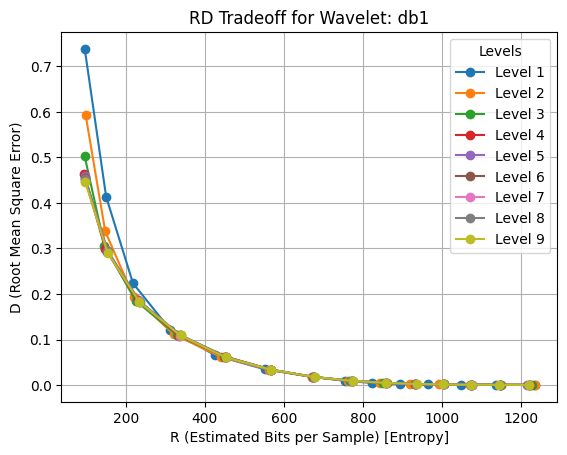

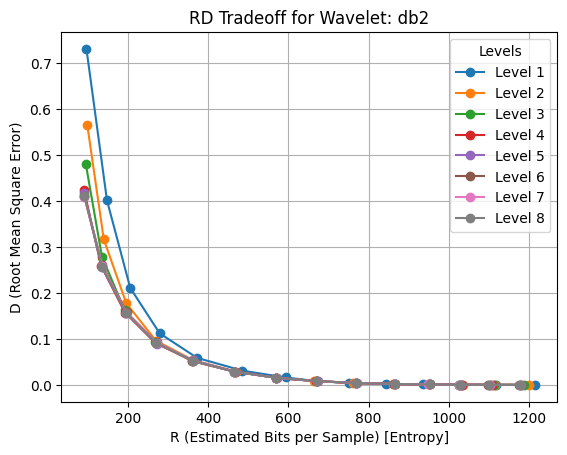

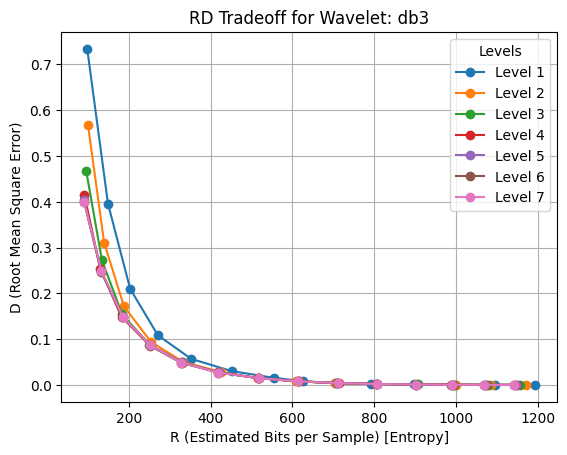

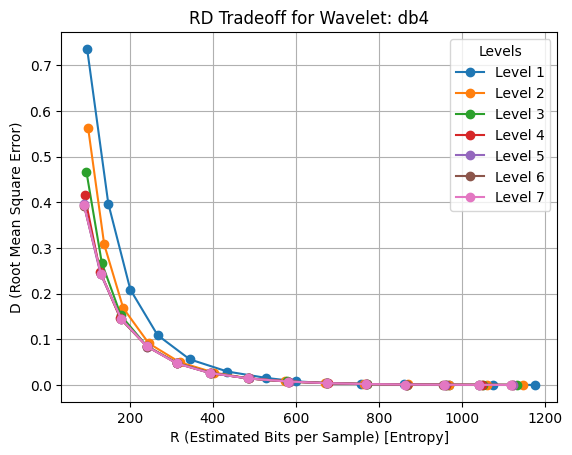

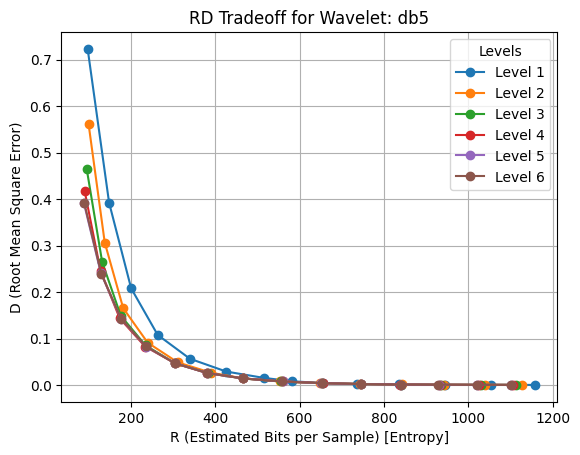

C:\Users\blaf2\AppData\Local\Temp\ipykernel_27516\231545551.py:19: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Levels")


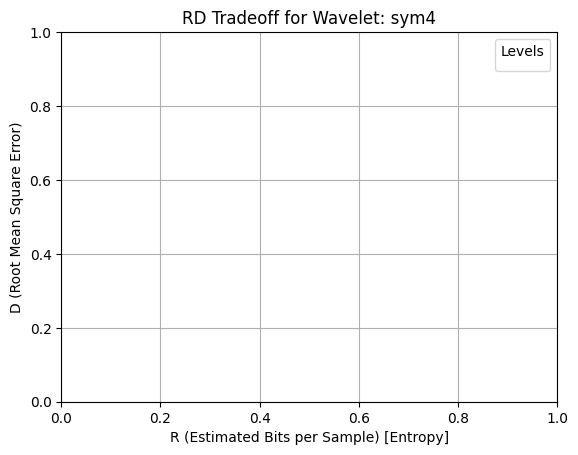

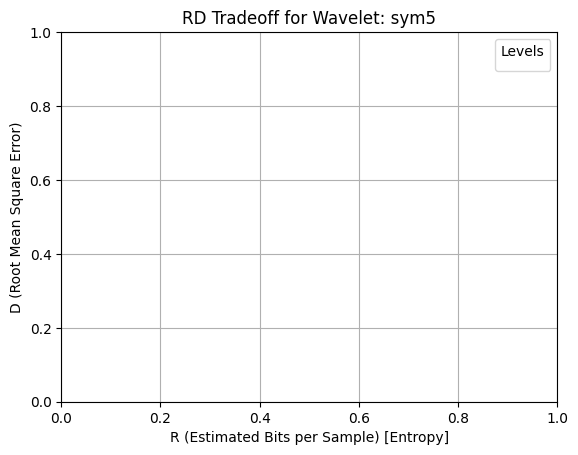

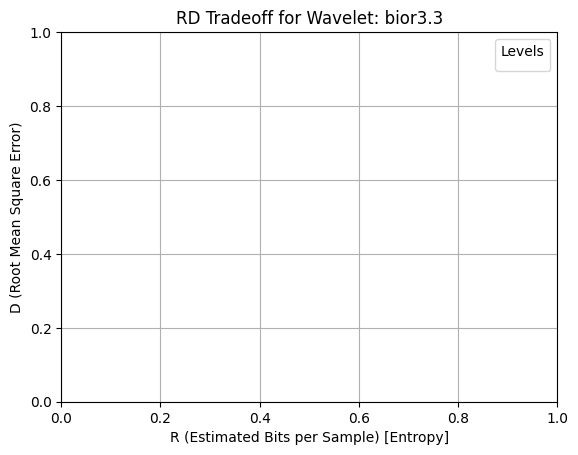

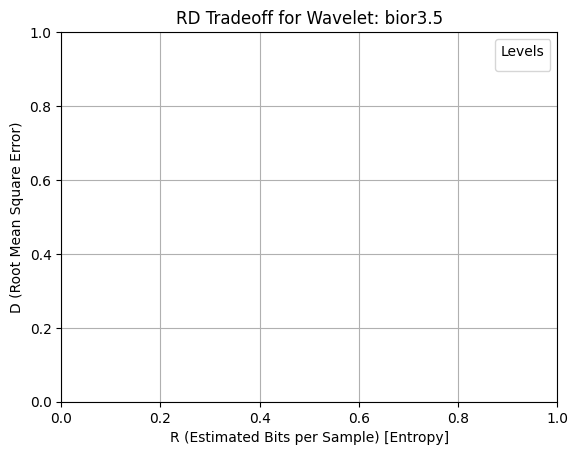

In [6]:
# Load points_per_wavelet
import pickle

with open("points_per_wavelet.pkl", "rb") as f:
    points_per_wavelet = pickle.load(f)

# Generate plots
for wavelet, levels_data in points_per_wavelet.items():
    plt.figure()
    plt.title(f"RD Tradeoff for Wavelet: {wavelet}")
    plt.xlabel("R (Estimated Bits per Sample) [Entropy]")
    plt.ylabel("D (Root Mean Square Error)")
    plt.grid(True)

    for level, points in levels_data.items():
        if points:
            plt.plot(*zip(*points), marker="o", linestyle="-", label=f"Level {level}")

    plt.legend(title="Levels")
    plt.show()